# Анализ рынка общественного питания Москвы для инвестиционного фонда

### Дополнительные материалы
Ссылка на презентацию - https://disk.yandex.ru/i/eOdE2n5-GBlHgQ

# Описание проекта

Инвестиционный фонд «Shut Up and Take My Money» заказал провести исследование рынка общественного питания г. Москвы. 


## Описание данных

Датасет `moscow_places.csv` хранит следующую информацию: 

- `name` — название заведения;  
- `address` — адрес заведения;  
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
- `hours` — информация о днях и часах работы;  
- `lat` — широта географической точки, в которой находится заведение;  
- `lng` — долгота географической точки, в которой находится заведение;  
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
    - «Средний счёт: 1000–1500 ₽»;  
    - «Цена чашки капучино: 130–220 ₽»;  
    - «Цена бокала пива: 400–600 ₽» ;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт».  
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино».  
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);  
- `district` — административный район, в котором находится заведение, например Центральный административный округ;  
- `seats` — количество посадочных мест.

## Цели исследования

1. Необходимо изучить направления - открыть ли кафе, ресторан, пиццерию, паб или бар. 

2. Подготовить варианты оптимального расположения заведения, проработать конкурентное меню и цены.

3. После выполнения анализа, необходимо подготовить презентацию для инвесторов. 

## Шаг 1. Загрузка данных и общая информация


Для начала загрузим сам датасет.

Путь к файлу: `/datasets/moscow_places.csv`

Необходимо проверить его на количество строк, формат данных и т.д.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
pd.set_option('display.max_columns', 0)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [2]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
 

In [3]:
display(df)
df.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в файле 8406 строк, некоторые столбцы имеют пропуски, есть разныетипы данных, при этом столбец hours не представлен в соответствующем формате. К тому же мы видим,что есть разный регистр в данных. 

Необходимо привести к стилистически верному написанию данные, изучить датасет на дубликаты, проработать пропуски.

In [4]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
df['avg_bill'] = df['avg_bill'].str.lower()
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
print('Количество заведений:', df['name'].nunique())
df['category'].value_counts()

Количество заведений: 5512


кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

**Вывод**

При количестве 8406 строк мы видим 5512 заведений -скорее всего это связано с сетевыми заведениями. У нас есть большее количество типов заведения чем указано при описании ТЗ. Учтем в работе. 

## Шаг 2. Предобработка данных

In [6]:
def describe_columns(df):
    for column in df.columns:
        print(f"Описание столбца '{column}':")
        print(df[column].describe())
        print()

In [7]:
describe_columns(df)

Описание столбца 'name':
count     8406
unique    5512
top       кафе
freq       189
Name: name, dtype: object

Описание столбца 'category':
count     8406
unique       8
top       кафе
freq      2378
Name: category, dtype: object

Описание столбца 'address':
count                                  8406
unique                                 5752
top       москва, проспект вернадского, 86в
freq                                     28
Name: address, dtype: object

Описание столбца 'district':
count                                   8406
unique                                     9
top       Центральный административный округ
freq                                    2242
Name: district, dtype: object

Описание столбца 'hours':
count                       7870
unique                      1307
top       ежедневно, 10:00–22:00
freq                         759
Name: hours, dtype: object

Описание столбца 'lat':
count    8406.000000
mean       55.750109
std         0.069658
min        55.573942


In [8]:
print('Количество явных строк-дубликатов:', df.duplicated().sum())

Количество явных строк-дубликатов: 0


In [9]:
#Предопологаю, что дубликаты могут быть по в двух столбцах - название заведения и адрес, в остальных стобцах данные могут сильно отличаться
df.duplicated(subset=['name', 'address']).sum()
print(len(df))
df = df.drop_duplicates(subset=['name', 'address'])
print(len(df))

8406
8402


In [10]:
#Изучим количество пропусков
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Видим пропуски в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. Пропусков много, просто избавиться от них не получится, без искажений. Как пример, изучим `middle_avg_bill`.


In [11]:
nan_avg_bill = df.groupby('avg_bill')['middle_avg_bill'].max().dropna()
display(nan_avg_bill.index)
display(nan_avg_bill.head())

Index(['средний счёт:100 ₽', 'средний счёт:1000 ₽',
       'средний счёт:1000–10000 ₽', 'средний счёт:1000–1100 ₽',
       'средний счёт:1000–1200 ₽', 'средний счёт:1000–1300 ₽',
       'средний счёт:1000–1350 ₽', 'средний счёт:1000–1400 ₽',
       'средний счёт:1000–1500 ₽', 'средний счёт:1000–1600 ₽',
       ...
       'средний счёт:от 499 ₽', 'средний счёт:от 50 ₽',
       'средний счёт:от 500 ₽', 'средний счёт:от 5000 ₽',
       'средний счёт:от 549 ₽', 'средний счёт:от 600 ₽',
       'средний счёт:от 650 ₽', 'средний счёт:от 700 ₽',
       'средний счёт:от 800 ₽', 'средний счёт:от 850 ₽'],
      dtype='object', name='avg_bill', length=555)

avg_bill
средний счёт:100 ₽            100.0
средний счёт:1000 ₽          1000.0
средний счёт:1000–10000 ₽    5500.0
средний счёт:1000–1100 ₽     1050.0
средний счёт:1000–1200 ₽     1100.0
Name: middle_avg_bill, dtype: float64

Отобрали все значения начинающиеся с "Средний счёт:". Попробуем заменить средними по совпадению в списке.

In [12]:
def avg(avg_bill):
    if avg_bill in nan_avg_bill:
        return nan_avg_bill[avg_bill]
df.loc[df['middle_avg_bill'].isna(), 'middle_avg_bill'] = df['avg_bill'].apply(avg)
print('Количество пропусков осталось:', df['middle_avg_bill'].isna().sum())

Количество пропусков осталось: 5253


Количество пропусков не изменилось, изучим внимательнее столбец со среднем чеком.

In [13]:
df1=df[df['middle_avg_bill'].isna()]
df1=df1[df1['avg_bill'].notnull()]
df1=df1[['avg_bill','middle_avg_bill']]
df1['avg_bill'].unique()

array(['цена чашки капучино:155–185 ₽', 'цена бокала пива:250–350 ₽',
       'цена бокала пива:120–350 ₽', 'цена чашки капучино:150–190 ₽',
       'цена чашки капучино:120–170 ₽', 'цена чашки капучино:100–200 ₽',
       'цена бокала пива:90–230 ₽', 'цена чашки капучино:150–210 ₽',
       'цена чашки капучино:80–160 ₽', 'цена чашки капучино:100 ₽',
       'цена чашки капучино:239–274 ₽', 'цена чашки капучино:130–190 ₽',
       'цена бокала пива:160–499 ₽', 'цена чашки капучино:200–300 ₽',
       'цена чашки капучино:150–180 ₽', 'цена чашки капучино:119–179 ₽',
       'цена чашки капучино:100–170 ₽', 'цена чашки капучино:200–240 ₽',
       'цена чашки капучино:150–200 ₽', 'цена бокала пива:199–300 ₽',
       'цена бокала пива:от 140 ₽', 'цена бокала пива:от 149 ₽',
       'цена бокала пива:150–450 ₽', 'цена чашки капучино:150–240 ₽',
       'цена чашки капучино:от 60 ₽', 'цена чашки капучино:120–180 ₽',
       'цена чашки капучино:179–249 ₽', 'цена чашки капучино:75 ₽',
       'цена чашк

Из полученных результатов можно сказать, что данные по среднему чеку распределены по разным категориям, и скорее всего это не является ошибкой. 

Относительно других столбцов, заполнять средним или медианным значением некорректно, так как количество мест в сетевых заведениях, тех, кто используют фуд корты, разное расположение и направленность — все это может кардинально влиять на цену. К тому же в мелких сетях могут быть ошибки (что указано в ТЗ), так что оставлю пропуски как есть.

Так же меня заинтересовало то, что возможны выбросы в 2 столбцах - средний чек и количество сидячих мест. Изучим это более подробно.

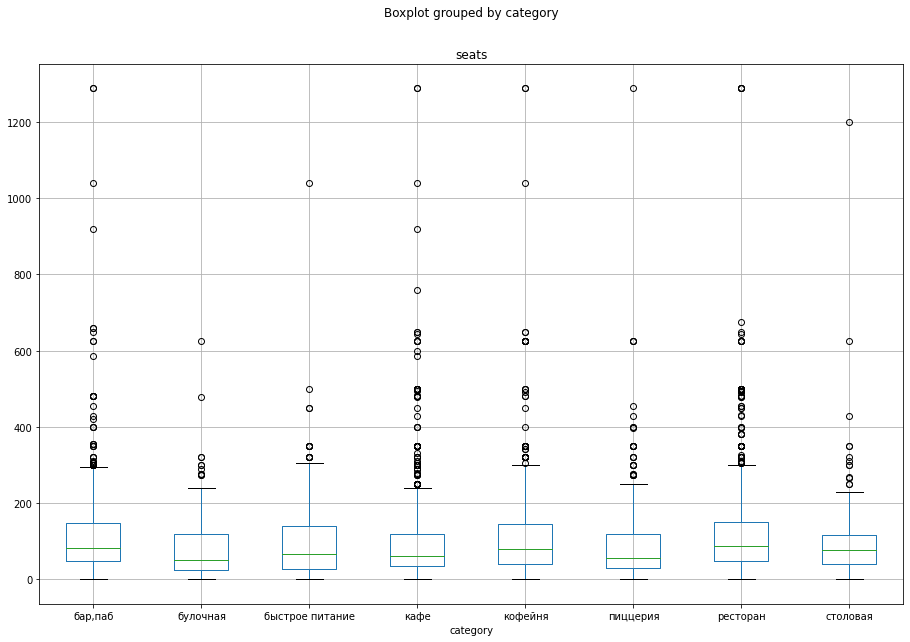

In [14]:
df.boxplot(column='seats', by='category', figsize=(15, 10))
plt.show()

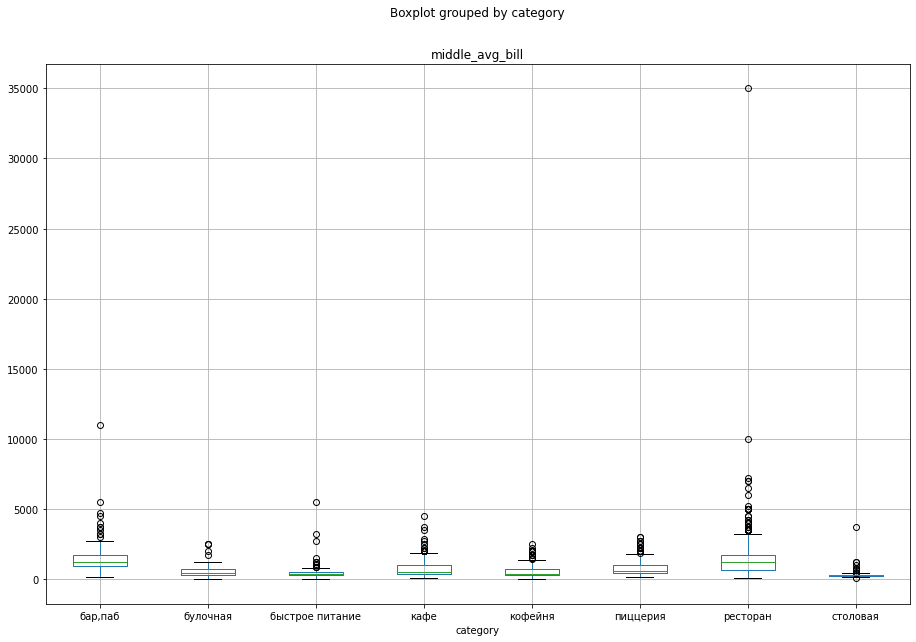

In [15]:
df.boxplot(column='middle_avg_bill', by='category', figsize=(15, 10))
plt.show()

Можно сказать, что у нас есть выбросы в обоих случаях. Возможно, они связаны с ошибкой и лишним написанием "0", либо это какие-то исключительные заведения. Проверим их количество.

In [16]:
print('Заведений с числом мест больше 600:', df[df['seats'] > 600]['name'].count())
print('Заведений с средним чеком более 5000:', df[df['middle_avg_bill'] > 5000]['name'].count())

Заведений с числом мест больше 600: 53
Заведений с средним чеком более 5000: 11


In [17]:
print(53 / 8406 *100, '%')
print(11 / 8406 *100, '%')

0.6305020223649773 %
0.13085891030216512 %


В обоих случаях мы видим, что таких заведениях меньше одного процента. Можем удалить данные строки. 

In [18]:
df = df.drop(df[df['seats'] > 600].index)
df = df.drop(df[df['middle_avg_bill'] > 5000].index)

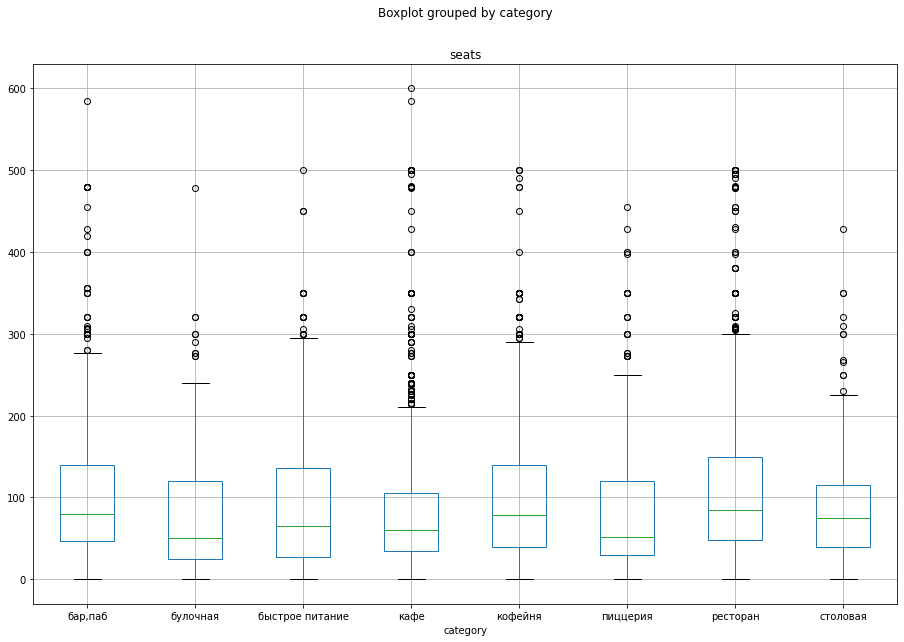

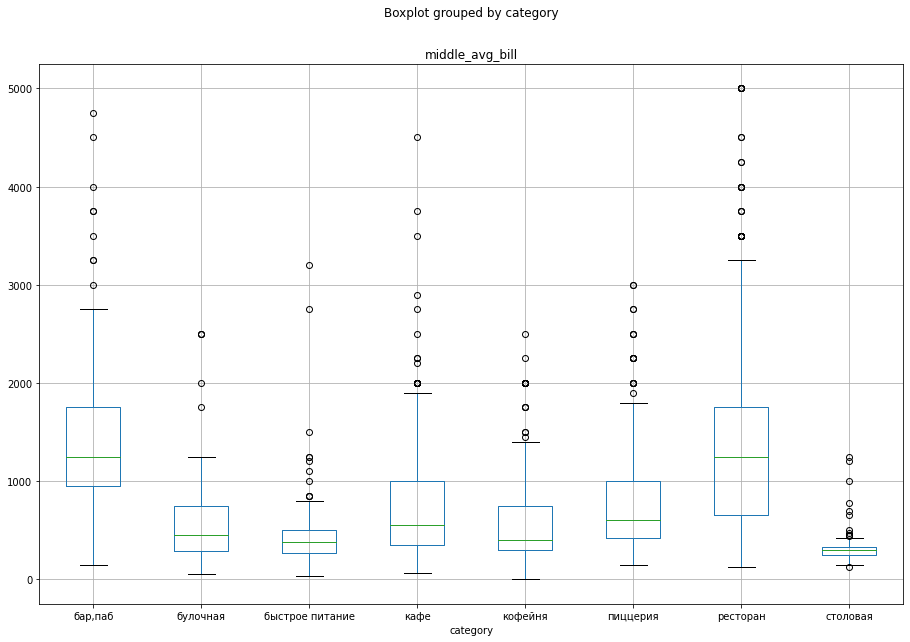

In [19]:
df.boxplot(column='seats', by='category', figsize=(15, 10))
plt.show()
df.boxplot(column='middle_avg_bill', by='category', figsize=(15, 10))
plt.show()

Создадим столбец `street` с названиями улиц из столбца с адресом

In [20]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек','парк','мост']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat, flags=re.I)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [21]:
street = df[df['street'].isna()]

Можно увидеть, что остались записи (134 штуки), которые не смогли оказаться в новом столбце. Связано это с тем, что их адрес может быть некорректно заполнен изначально.

In [22]:
street.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 134 entries, 25 to 8395
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               134 non-null    object 
 1   category           134 non-null    object 
 2   address            134 non-null    object 
 3   district           134 non-null    object 
 4   hours              108 non-null    object 
 5   lat                134 non-null    float64
 6   lng                134 non-null    float64
 7   rating             134 non-null    float64
 8   price              20 non-null     object 
 9   avg_bill           23 non-null     object 
 10  middle_avg_bill    22 non-null     float64
 11  middle_coffee_cup  1 non-null      float64
 12  chain              134 non-null    int64  
 13  seats              0 non-null      float64
 14  street             0 non-null      object 
dtypes: float64(6), int64(1), object(8)
memory usage: 16.8+ KB


In [23]:
print(134/8338*100, '%')

1.6071000239865674 %


В целом большая часть этих данных относительно цен, к тому же их количество меньше 5%, можно убрать данные строки из датафрейма

In [24]:
df.dropna(subset=['street'], inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8204 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8204 non-null   object 
 1   category           8204 non-null   object 
 2   address            8204 non-null   object 
 3   district           8204 non-null   object 
 4   hours              7702 non-null   object 
 5   lat                8204 non-null   float64
 6   lng                8204 non-null   float64
 7   rating             8204 non-null   float64
 8   price              3265 non-null   object 
 9   avg_bill           3760 non-null   object 
 10  middle_avg_bill    3100 non-null   float64
 11  middle_coffee_cup  528 non-null    float64
 12  chain              8204 non-null   int64  
 13  seats              4731 non-null   float64
 14  street             8204 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 1.0+ MB


Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [25]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


In [26]:
##Проверим насколько изменилось количество строк.

original_rows = 8406
current_rows = 8204
difference = original_rows - current_rows
percentage_change = (difference / original_rows) * 100

print(f"Количество строк уменьшилось на {percentage_change:.2f}%.")

Количество строк уменьшилось на 2.40%.


В целом, общее количество изменений меньше 5%, при этом они включают себя те строки, которые либо имеют выбросы, что негативно повлияет на исследование, либо строки с малым количеством данных. Считаю, что предобработка данных прошла успешно и можно начать анализ.

## Шаг 3. Анализ данных
[Содержание](#intro)

### Категории заведений 

Изучим количество заведений по категориям в данных.

In [27]:
category_name = df.groupby('category')['name'].count().reset_index()
category_name.columns = ['category', 'count']
category_name


,category,count
0,"бар,паб",748
1,булочная,252
2,быстрое питание,588
3,кафе,2299
4,кофейня,1371
5,пиццерия,626
6,ресторан,2010
7,столовая,310


In [28]:
go.Figure(data=[go.Pie(labels=category_name['category'], values=category_name['count'])], 
          layout=go.Layout(title=go.layout.Title(text="Круговая диаграмма категорий заведений")))

In [29]:
fig = px.bar(category_name, 
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов общественного питания по видам'
            )
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show() # выводим график

По количеству заведений лидируют кафе с численностью 2299, на последнем булочные - 252 заведения.

**Вывод**

Кафе и рестораны составляют почти 52,5% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33,45% от общего числа заведений. На булочные, столовые и быстрое питание приходится 14.05%.
Соответственно можно отметить, что наибольшая конкуренция будет именно в кафе и барах, в тоже время нельзя говорить, что выгоднее всего открывать булочную, так как меньшее количество заведений может означать невостребованность заведений такого толка, столовые обычно находятся рядом с ТЦ и предприятиями, где принимают пищу ближайшие работники, что так же важно учитывать.


<div class="alert alert-success">
<b>Комментарий ревьюера:</b>
    
Определено количество заведений и по типу👍 
    
Отличные интерактивные графики! Здорово, что столбчатый график выполнен в одном цвете✨
    
Молодец, что фиксируешь выводы по заданию✨

</div>

### Исследование количества посадочных мест в местах по категориям.
[Содержание](#intro)

In [30]:
df.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",457.0,110.12,95.86,0.0,47.00,80.0,140.00,585.0
булочная,147.0,85.74,87.35,0.0,25.00,50.0,120.00,478.0
быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
кафе,1205.0,90.25,91.07,0.0,35.00,60.0,106.00,600.0
кофейня,739.0,100.43,90.99,0.0,40.00,78.0,140.00,500.0
пиццерия,423.0,87.91,85.48,0.0,30.00,52.0,120.00,455.0
ресторан,1250.0,114.82,97.13,0.0,48.00,85.0,150.00,500.0
столовая,162.0,89.72,77.27,0.0,40.00,75.0,115.00,428.0


In [31]:
mean_seats = df[df['seats'] != 0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False).round(2)
median_seats = df[df['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=mean_seats['category'],
    y=mean_seats['seats'],
    name='Среднее количество мест',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=median_seats['category'],
    y=median_seats['seats'],
    name='Медианное количество мест',
    marker_color='orange'
))

fig.update_layout(
    title='Среднее и медианное количество мест в заведениях Москвы',
    xaxis=dict(title='Тип заведения'),
    yaxis=dict(title='Количество мест'),
    barmode='group',
    bargap=0.15,
    bargroupgap=0.1
)

fig.show()

Если судить по среднему значению, то значения не сильно различаются - от 116 мест в кофейнях до 90 мест в пиццериях. Но я считаю считать по среднему некорректным, т.к. заведения могут находиться, например на ТЦ и для них все места на фуд кортах будут считаться как места для, например, булочной. 

Правильнее ориентироваться на медианное количество. Тогда разница будет от 86.5 в ресторанах до 51 одного в булочных. В целом можно выделить два направления - если будущее заведение рассчитывает на большое количество посадочных мест, то лучше открывать ресторан, бар или паб, кофейню. Можно отметить заведения быстрого питания или столовые, но опять же - быстрое питание стоит проверить на принадлежность к сетям, а столовые на местоположение к производствам или ТЦ. 

Кафе, пиццерии и булочные имеют наглядное различие, однако это можно объяснить спецификой заведений - пиццерии зачастую больше ориентированы на доставку, булочные на продажу выпечки с собой. Кафе сами по себе зачастую являются небольшими заведениями.


### Cоотношение сетевых и несетевых заведений в датасете
[Содержание](#intro)

In [32]:
chain = df['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5072
1,1,3132


In [33]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

Почти 2/3 заведений москвы не относится к сетевым. Уточним с разбивкой на категории. 

In [34]:
chain_objects = df.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['object_type', 'chain', 'count']
chain_objects['chain'] = chain_objects['chain'].astype(object)
chain_objects = chain_objects.sort_values(['count', 'chain'])
chain_objects

,object_type,chain,count
15,столовая,1,87
2,булочная,0,97
3,булочная,1,155
1,"бар,паб",1,165
14,столовая,0,223
5,быстрое питание,1,225
10,пиццерия,0,300
11,пиццерия,1,326
4,быстрое питание,0,363
0,"бар,паб",0,583


In [35]:

fig = go.Figure(data=[
    go.Bar(
        x=chain_objects['count'],
        y=chain_objects['object_type'],
        text=chain_objects['count'],
        orientation='h',
        marker=dict(color=chain_objects['chain'])
    )
])

fig.update_layout(
    title='Соотношение сетевых заведений',
    xaxis_title='Количество заведений',
    yaxis_title='Название категорий',
    barmode='group'  # Добавляем barmode='group' для группировки столбцов
)

fig.update_traces(
    hovertemplate='Количество: %{x}<br>Тип заведения: %{y}<br>Сеть: %{marker.color}'
)

fig.show()

Сеть 1 означает, что заведение сетевое, 0 - нет.

Во-первых отмечу, что кафе быстрого питания, как оказалось по большей степени не является сетевым, о чем я говорил предполагал выше.

Наибольшее количество сетевых заведений в категориях ресторан и булочные. Меньше всего их в столовых, быстром питании и барах. Примерно равное в пиццериях и кофейнях. 

### Топ-15 популярных сетей в Москве
[Содержание](#intro)


In [36]:
df_chain = df[df['chain'] == 1]
top_15 = df_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.2,кофейня,118
1,домино'с пицца,4.2,пиццерия,76
2,додо пицца,4.3,пиццерия,74
3,one price coffee,4.2,кофейня,70
4,яндекс лавка,4.0,ресторан,68
5,cofix,4.1,кофейня,65
6,prime,4.2,ресторан,50
7,хинкальная,4.4,кафе,44
8,кофепорт,4.2,кофейня,42
9,теремок,4.1,ресторан,38


In [37]:
print('Всего заведений в Топ-15:', top_15['count'].sum())

Всего заведений в Топ-15: 808


In [38]:
fig = px.bar(top_15, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count', # добавляем аргумент, который отобразит текст с информацией
             color='name'                   # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False)
fig.show() # выводим график

В топ-3 входят Шоколадница, Домино'c пицца и Додо-пицца. Это кофейня и две пиццерии. 

### Административные районы Москвы
[Содержание](#intro)

Посмотрим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [39]:
district_chain_df = df.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
district_chain_df = district_chain_df.sort_values('rating', ascending = False).reset_index()
district_chain_df = district_chain_df.rename(columns={'name':'count'})
print('Административные районы Москвы в датасете:')
print()
print(district_chain_df['district'].unique())
print()
print('Общее количество заведений в датасете:',df['name'].count())


Административные районы Москвы в датасете:

['Центральный административный округ' 'Западный административный округ'
 'Северо-Западный административный округ'
 'Северный административный округ' 'Юго-Западный административный округ'
 'Южный административный округ' 'Юго-Восточный административный округ'
 'Восточный административный округ'
 'Северо-Восточный административный округ']

Общее количество заведений в датасете: 8204


In [40]:
fig = px.bar(district_chain_df, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                   #font=dict(size=8),
                   #autosize=False,
                   #width=1000,
                   #height=800
                 )
fig.show() # выводим график

**Вывод:**

Всего у нас 9 округов.  
По графику видно, что больше всего заведений по всем категориям находится в центральном административном округе. Больше всего в нем категорий кафе, кофейня и ресторан, что вполне логично, так как люди приезжают в центр города отдыхать, гулять или за покупками. В целом категория заведений кафе хорошо распределена по всем округам. Столовых меньше всего по всем округам, но их и меньшее количество.


### Средние рейтинги по категориям
[Содержание](#intro)

Визуализируем распределение средних рейтингов по категориям заведений.

In [41]:
rating_category = df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [42]:
fig = px.bar(rating_category, # загружаем данные и заново их сортируем
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating', # добавляем аргумент, который отобразит текст с информацией
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show() # выводим график

**Вывод:**

Из графика выше мы видим, что самый большой рейтинг в категории бар/паб. У пиццерий, ресторанов, кофеен и булочных примерно одинаковый рейтинг. Самый маленький у ресторанов быстрого питания. Также мы видим, что в нашей выборке средние значения по категориям выше 4.

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района
[Содержание](#intro)

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson`

In [43]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.18
1,Западный административный округ,4.18
2,Северный административный округ,4.25
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.20
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [44]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [45]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По данным можно увидеть, что наиболее высокие рейтинги заведений в Центре Москвы - 4.38. Наименьший в Юго-Восточном - 4.1

### Заведения датасета на карте
[Содержание](#intro)

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.

In [46]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

По карте отчетливо видно, что основная масса заведений сконцентрирована в центре Москвы. Уже меньше на севере и еще меньше на юге.

### Топ-15 улиц по количеству заведений
[Содержание](#intro)

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [47]:
streets_moscow = df[df['street'].notnull()]
top15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street_name', 'count']
top15_streets

,street_name,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,87
5,каширское шоссе,76
6,варшавское шоссе,75
7,ленинградский проспект,72
8,ленинградское шоссе,69
9,мкад,65


In [48]:
#создадим таблицу с названиями улиц и категорий
streets_category = df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street_name,category,count
2079,проспект мира,кафе,53
2082,проспект мира,ресторан,45
1498,мкад,кафе,45
2080,проспект мира,кофейня,36
2091,профсоюзная улица,кафе,35
...,...,...,...
1495,мишина улица,кофейня,1
1496,мкад,"бар,паб",1
1501,мкад,столовая,1
1505,можайское шоссе,пиццерия,1


In [49]:
#оставим только улицы из топ 15
streets15_category = streets_category[streets_category['street_name'].isin(top15_streets['street_name'])]
streets15_category

,street_name,category,count
320,алтуфьевское шоссе,"бар,паб",5
321,алтуфьевское шоссе,булочная,1
322,алтуфьевское шоссе,быстрое питание,5
323,алтуфьевское шоссе,кафе,13
324,алтуфьевское шоссе,кофейня,9
...,...,...,...
2721,улица вавилова,быстрое питание,11
2722,улица вавилова,кафе,15
2723,улица вавилова,кофейня,10
2724,улица вавилова,пиццерия,3


In [50]:
fig = px.bar(streets15_category, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='street_name', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                   #font=dict(size=8),
                   #autosize=False,
                   #width=1000,
                   #height=800
                 )
fig.show() # выводим график

Из графика выше мы видим, что больше всего заведений на проспекте Мира. Преобладают категории кафе и рестораны. Столовых меньше всего.  
Следом за ним идет Профсоюзная, ситуация с категориями там аналогична.  
Меньше всего заведений на улице Миклухо-Маклая. Среди популярных категорий также кафе и рестораны.

**Найдем улицы, на которых находится только один объект общепита.**


In [51]:
one_cafe = df['street'].value_counts().reset_index()
one_cafe.columns = ['street_name', 'cafe_count']
one_cafe = one_cafe[one_cafe['cafe_count'] == 1]
one_cafe

,street_name,cafe_count
969,1-й сетуньский проезд,1
970,триумфальная площадь,1
971,1-я боевская улица,1
972,2-й кожуховский проезд,1
973,чапаевский переулок,1
...,...,...
1387,боярский переулок,1
1388,троилинский переулок,1
1389,улица маршала баграмяна,1
1390,улица 800-летия москвы,1


In [52]:
#добавим районы
streets1_category = streets_category[streets_category['street_name'].isin(one_cafe['street_name'])]
streets1_category = streets1_category.groupby('category')['street_name'].count()
streets1_category

category
бар,паб             40
булочная             9
быстрое питание     20
кафе               142
кофейня             74
пиццерия            14
ресторан            88
столовая            36
Name: street_name, dtype: int64

Из данных выше мы видим, что 423 улицы имеют только одно заведение. Больше всего из них относятся к категории кафе.

### Значения средних чеков заведений
[Содержание](#intro)

Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [53]:
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,650.0
8,Южный административный округ,500.0


In [54]:
median_bill2 = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,650.0
8,Южный административный округ,500.0


In [55]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

По данным выше мы видим, что самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Из таблицы выше видно, что средний чек округов вокруг центрального в среднем отличается в 1,5 - 2 раза.

### Общий вывод
[Содержание](#intro)

Проведя анализ, мы убедились, что по количеству заведений лидируют кафе с численностью 2299, немного меньше ресторан - 2010. На последнем месте булочная - 252.

Кафе и рестораны составляют почти 52,5% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33,45% от общего числа заведений. На булочные, столовые и быстрое питание приходится 14,05%.

Также мы увидели, что больше всего посадочных мест предоставляют рестораны, что понятно, так как такова специфика этих заведений, люди приходят туда отдохнуть и поесть. Следом идут заведения быстрого питания, так как они больше всего распространены. Для кафе и столовых посадочных мест меньше всего.

В Москве почти 62% заведений не являются сетевыми.
По графику мы увидели, что в основной массе заведения не являются сетевыми. За исключением категорий: кофейня - здесь количество сетевых немного больше, пиццерия - здесь сетевых точек уже заметно больше, булочная - здесь разница самая большая.

Из полученных данных мы видим, что самая популярная сеть в Москве - Шоколадница. На втором и третьем месте известные пиццерии. Меньше всего заведений в сети Му-Му.

Всего заведений в Топ-15: 808

По графику отчетливо видно, что больше всего заведений в категории кофейня. У ресторанов, пиццерий и кафе примерно одинаковое количество. У булочных в топ-15 меньше всего заведений.

Больше всего заведений из топ-15 находятся в Центральный административный округе. Преимущественно категории кафе, кофейни и рестораны. Примерно одинаково у Южного административного округа, Северного административного округа, Западного административного округа и Северо-Восточного административного округа. Здесь заметно увеличивается доля категории быстрого питания. Меньше всего заведений из топ-15 в Северо-Западном административном округе.

Всего у нас 9 округов. По графику видно, что больше всего заведений по всем категориям находится в центральном административном округе. Больше всего в нем категорий кафе, кофейня и ресторан, что вполне логично, так как люди приезжают в центр города отдыхать, гулять или за покупками. В целом категория заведений кафе хорошо распределена по всем округам. Столовых меньше всего по всем округам.

Еще мы видим, что самый большой рейтинг в категории бар/паб. У пиццерий, ресторанов, кофеен и булочных примерно одинаковый рейтинг. Самый маленький у ресторанов быстрого питания. Также мы видим, что в нашей выборке средние значения по категориям выше 4.

По данным можно сказать, что самый высокий рейтинг в заведениях в Центральном административном округе - 4.38. Самый низкий в Юго-Восточном административном округе - 4.1.

По карте отчетливо видно, что основная масса заведений сконцентрирована в центре Москвы. Уже меньше на севере и еще меньше на юге.

Из графика выше мы видим, что больше всего заведений на проспекте Мира. Преобладают категории кафе и рестораны. Столовых меньше всего. Следом за ним идет Профсоюзная, ситуация с категориями там аналогична. Меньше всего заведений на улице Миклухо-Маклая. Среди популярных категорий также кафе и рестораны.

Также мы видим, что 425 улиц имеют только одно заведение. Больше всего из в категории кафе.

Мы убедились, что самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Из таблицы выше видно, что средний чек округов вокруг центрального в среднем отличается в 1,5 - 2 раза.


## Шаг 4. Детализируем исследование: открытие кофейни
[Содержание](#intro)

Ответим на следующие вопросы:  
Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?  
Есть ли круглосуточные кофейни?  
Какие у кофеен рейтинги? Как они распределяются по районам?  

### Количество кофеен

In [56]:
cofe_df = df[df['category'] == 'кофейня']
print('Всего кофейн:', cofe_df.shape[0])

Всего кофейн: 1371


In [57]:
cafe_by_district = df[df['category'] == 'кофейня']
cafe_count_by_district = cafe_by_district.groupby('district')['category'].count().reset_index()
cafe_count_by_district = cafe_count_by_district.rename(columns={'category': 'Количество кофейн'})
cafe_count_by_district = cafe_count_by_district.sort_values('Количество кофейн', ascending=False)


cafe_count_by_district


,district,Количество кофейн
5,Центральный административный округ,426
2,Северный административный округ,180
3,Северо-Восточный административный округ,152
1,Западный административный округ,142
8,Южный административный округ,129
0,Восточный административный округ,102
7,Юго-Западный административный округ,94
6,Юго-Восточный административный округ,86
4,Северо-Западный административный округ,60


In [58]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_df.apply(create_clusters, axis=1)

# выводим карту
m3

У нас 1371 кофеен. Больше всего в Центральном округе. Следом на юго-западе и на северной части города. 

### Время работы

In [59]:
cofe_24_7 = cofe_df[cofe_df['is_24/7'] == True]
print('Круглосуточных кофейн:', cofe_24_7.shape[0])

Круглосуточных кофейн: 58


In [60]:
cafe_by_district = df[(df['category'] == 'кофейня') & (df['is_24/7'] == True)]
cafe_count_by_district = cafe_by_district.groupby('district')['category'].count().reset_index()
cafe_count_by_district = cafe_count_by_district.rename(columns={'category': 'Количество кофейн'})
cafe_count_by_district = cafe_count_by_district.sort_values('Количество кофейн', ascending=False)

# Выводим обновленный датафрейм
print(cafe_count_by_district)


                                  district  Количество кофейн
5       Центральный административный округ                 26
1          Западный административный округ                  9
7      Юго-Западный административный округ                  6
0         Восточный административный округ                  5
2          Северный административный округ                  5
3  Северо-Восточный административный округ                  3
4   Северо-Западный административный округ                  2
6     Юго-Восточный административный округ                  1
8             Южный административный округ                  1


In [61]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_24_7.apply(create_clusters, axis=1)

# выводим карту
m4

Количество круглосуточных кофеен - 58. По карте видно, что большинство находится в центре города. Связываю это с тем, что ночью люди любят гулять по центру и спрос на кофе присутствует. В других районах это не распространено. Опять же, смею предположить, что в датасете не указаны точки самообслуживания, типа Coffe Like 

### Рейтинги кофеен
[Содержание](#intro)

Посмотрим какие у кофеен рейтинги. Как они распределяются по районам.

In [62]:
rating_cofe = cofe_df.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_cofe

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.32
2,Северный административный округ,4.31
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.24
3,Северо-Восточный административный округ,4.21
6,Юго-Восточный административный округ,4.21
1,Западный административный округ,4.19


In [63]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m5)

# выводим карту
m5

Самый высокий рейтинг в округах: Центральный административный округ и Северо-Западный административный округ. Самый низкий рейтинг у Западного административного округа.

###  Стоимость чашки капучино
[Содержание](#intro)

Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии.


In [64]:
median_coffee_price_by_district = cofe_df.groupby('district')['middle_coffee_cup'].median().round(2).reset_index()
median_coffee_price_by_district = median_coffee_price_by_district.rename(columns={'middle_coffee_cup': 'median'})
median_coffee_price_by_district = median_coffee_price_by_district.sort_values('median', ascending=False)
display(median_coffee_price_by_district)
print('Медианная стоимость чашки кофе в Москве:', median_coffee_price_by_district['median'].mean().round(2))

,district,median
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,160.0
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Медианная стоимость чашки кофе в Москве: 165.72


Самый дорогой кофе в Центральном, Западном и Юго-Западном округах, их средняя стоимость - 186,75. Средняя стоимость стоимость чашки кофе по всей Москве составляет 171.23.

При открытии нового заведения, для формирования цены стоимости чашки кофе, стоит ориентироваться на район, в котором вы открываете заведение. Цена должна быть не выше средней по району.

**Рекомендация:**  
При открытии новой кофейни лучше выбрать Центральный, Западный или Юго-Западный округа, так как высокая средняя стоимость чашки кофе позволит иметь хорошую маржинальность. Также это позволит при запуске заведения снизить стоимость чашки кофе для старта, без серьезных потерь.

Стоит рассмотреть круглосуточный режим работы. На Западном и Юго-Западном округах явный недостаток круглосуточных точек. Однако важно выбрать место, где люди могут проводить вечерней или ночной досуг - недалеко от парков, культурных достопримечательностей, либо гостиниц. В Центральном округе также лучше рассмотреть формат 24/7, так как это самый оживленный район с большим количеством пешеходных улиц и оживлен в ночное время.

Также у заведений западного направления мы отметили низкий рейтинг заведений. Это можно использовать как преимущество при старте. Но необходимо провести анализ отзывов, попытаться понять что не нравится посетителям и использовать это как преимущество.